In [1]:
import numpy as np
import scipy as sp
from PIL import Image

import matplotlib.pylab as plt
import matplotlib.animation as animation
from matplotlib.lines import Line2D

import scipy.stats as st
from sortedcontainers import SortedDict
from skimage.restoration import unwrap_phase

from IPython.display import HTML

import math
import random
import opticspy as opy

from scipy.optimize import curve_fit, minimize


In [2]:
%pylab inline
pylab.rcParams['figure.figsize'] = (12, 10)

Populating the interactive namespace from numpy and matplotlib


In [3]:
nz = 10 # number of steps
dz = 10 # step size (microns)

M       = 1000                # Grid points in microns
size_x  = 1024                # Step size in micron 
size_y  = 1024                # Step size in micron
wavelength   = 0.6283              # Wavelength of laser, micron
z       = 10                  # Distance in micron for beam input onto aperture
w       = 100                 # beam waist (radius) microns
zmax    = 1000                # (pi*4.7^2)/lambda;    % Distance in micron for beam propagating after lens
c1      = 4                   # Topological charge
f       = 500                 # effective focal length of lens, microns
#P       = lbmda/4             # pitch

z2 = 0 

#x,y,dz,CC1,amp1,G1,M,w,amp,mask

#CC1 = amp.*mask.*lens

In [4]:
def get_kernel(wavelength,z,dx,dy,x,y):
    kernelFactor = 2*math.pi*z/wavelength
    
    dfx = 1/(dx*x)
    dfy = 1/(dy*y)
    
    # Count up then down eg: [0,1,2,1,0]
    if x % 2 == 0:
        x2 = np.append(np.arange(x/2),np.flip(np.arange(x/2)))
    else:
        x2 = np.append(np.arange((x/2)-1),[math.ceil(x/2)])
        x2 = np.append(x2,np.flip(np.arange((x/2)-1)))
        
    if y % 2 == 0:
        y2 = np.append(np.arange(y/2),np.flip(np.arange(y/2)))
    else:
        y2 = np.append(np.arange((y/2)-1),[math.ceil(y/2)])
        y2 = np.append(y2,np.flip(np.arange((y/2)-1)))
    
    l = x2 - (x/2) + 1
    l2 = (l**2) * (dfx**2)
    
    m = y2 - (y/2) + 1
    m2 = (m**2) * (dfy**2) + 1
    
    l2 = np.arange(x)-int(x/2)
    m2 = np.arange(y)-int(y/2)
    
    l3 = np.broadcast_to(l2, (y,x)).transpose()
    m3 = np.broadcast_to(m2, (x,y))
    
    kernelPhase = np.power(1 - (wavelength*l3/dx)**2 - (wavelength*m3/dy)**2,(1/2)) * kernelFactor
    
    real = np.cos(kernelPhase)
    img = 1j*np.sin(kernelPhase)
    
    return real+img

(525, 524)


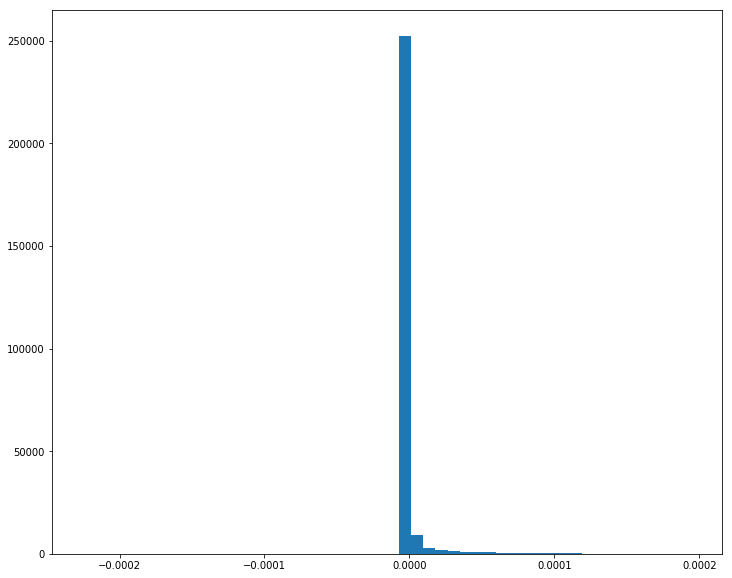

In [114]:
# https://stackoverflow.com/questions/28342968/how-to-plot-a-2d-gaussian-with-different-sigma

#TODO: Get sigma, size right
def generate_gaussian_grid(size_x,size_y,sigma_x=3.,sigma_y=3.):
    #size_x *= 2
    #size_y *= 2
    
    x = np.linspace(-int(size_x/2), int(size_x/2), size_x)
    y = np.linspace(-int(size_y/2), int(size_y/2), size_y)

    x, y = np.meshgrid(x, y)
    z = (1/(2*np.pi*sigma_x*sigma_y) * np.exp(-(x**2/(2*sigma_x**2) + y**2/(2*sigma_y**2))))
    #plt.contourf(x, y, z, cmap='Blues')
    #plt.colorbar()
    #plt.show()
    
    #z = z[int(size_y/2):,:int(size_x/2)].transpose()
    
    return z

#print(z.shape)

#plt.contourf(x, y, z, cmap='Blues')
#plt.colorbar()
#plt.show()

#gauss = generate_gaussian_grid(250,300,10,10)
#plt.imshow(gauss)
#plt.colorbar()
plt.hist(gauss.flatten(),50)
print(gauss.shape)

In [6]:
# https://stackoverflow.com/questions/12141150/from-list-of-integers-get-number-closest-to-a-given-value
def takeClosest(myList, myNumber):
    """
    Assumes myList is sorted. Returns closest value to myNumber.

    If two numbers are equally close, return the smallest number.
    """
    pos = bisect_left(myList, myNumber)
    if pos == 0:
        before = None
        after = None
    elif pos == len(myList):
        before = myList[-1]
        after = None
    else:
        before = myList[pos - 1]
        after = myList[pos]
    
    return before, after

'''
    0 - reject
    1 - accept
    2 - unsure
'''
def check(keys,sd,uni,sam):
    hi = len(keys)
    lo = 0
    
    if hi == 1:
        return 2
    
    if hi == 2:
        if keys[0] < uni and sam > sd.get(keys[0]):
            return 0
            
        if keys[1] > uni and sam < sd.get(keys[1]):
            return 1
        return 2
        
    
    while lo < hi:
        mid = (lo+hi)//2
        mk = keys[mid]
        if mk < uni and sam > sd.get(mk):
            return 0
        if mid < (hi-1):    
            mk2 = keys[mid+1]
            if mk2 > uni and sam < sd.get(mk2):
                return 1
        
        if mk < uni: lo = mid+1
        else: hi = mid
    return 2

In [109]:
class speckle_noise(st.rv_continuous):
    mu = 0.995
    sd = SortedDict([])
    
    def _pdf(self,epsilon):
        b = np.abs(self.mu) * np.cos(epsilon)
        f = (1-np.power(np.abs(self.mu),2))/(2*np.pi)
        g = np.power(1-np.power(b,2),(-3/2))
        h = (b * np.arcsin(b))+((np.pi*b)/2) + np.power(1-np.power(b,2),(1/2))

        return f*g*h
        
    def rvs(self,size):
        res = []
        pdf = self._pdf(0)
        
        self.sd.update([(0,pdf)])
        self.keys = list(self.sd.keys())
        
        while len(res) < size:
            uni = np.random.uniform(0,self.b) # Since the function is mirrored around 0
            sam = np.random.uniform(0,pdf)
            
            c = check(self.keys,self.sd,uni,sam)
            
            if c == 0:
                continue
            if c == 1:
                sign = np.random.randint(2)+1
        
                res.append(uni*((-1)**sign))
                continue
            
            pdf_val = self._pdf(uni)
            if sam < pdf_val:
                sign = np.random.randint(2)+1
        
                res.append(uni*((-1)**sign))
                self.sd.update([(uni,pdf_val)])
                self.keys = list(self.sd.keys())

        return np.array(res)

noise_dist = speckle_noise(a=-math.pi, b=math.pi, name='speckle')
    
def generate_noise(x,y):
    noise = noise_dist.rvs(size=(x*y))
    noise = noise.reshape((x,y))
    
    return noise

(array([4.2000e+01, 0.0000e+00, 0.0000e+00, 0.0000e+00, 4.8000e+01,
        0.0000e+00, 0.0000e+00, 1.8000e+01, 0.0000e+00, 3.2000e+01,
        1.2800e+02, 2.7000e+01, 4.2000e+01, 5.8000e+01, 1.2000e+01,
        0.0000e+00, 3.6000e+01, 1.6700e+02, 3.7000e+01, 1.9100e+02,
        4.5500e+02, 6.3800e+02, 9.1400e+02, 3.5330e+03, 8.0100e+03,
        2.2224e+04, 2.4833e+04, 9.1680e+03, 2.8480e+03, 1.2860e+03,
        3.5600e+02, 1.6700e+02, 7.3000e+01, 1.7300e+02, 2.1900e+02,
        1.5600e+02, 5.4000e+01, 6.4000e+01, 2.0000e+00, 4.3000e+01,
        5.0000e+00, 1.8000e+01, 3.2000e+01, 0.0000e+00, 1.8000e+01,
        9.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 4.0000e+01]),
 array([-3.13654004, -3.01577604, -2.89501204, -2.77424804, -2.65348404,
        -2.53272004, -2.41195604, -2.29119204, -2.17042804, -2.04966404,
        -1.92890004, -1.80813605, -1.68737205, -1.56660805, -1.44584405,
        -1.32508005, -1.20431605, -1.08355205, -0.96278805, -0.84202405,
        -0.72126005, -0.60

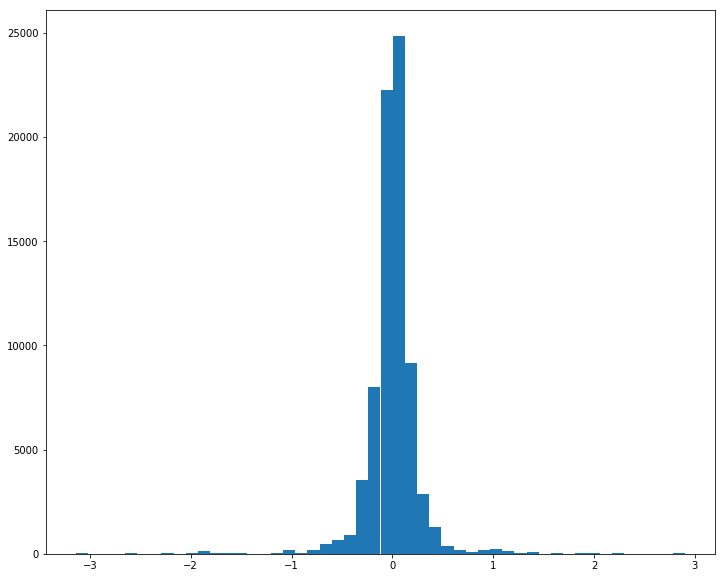

In [110]:
x = 276
y = 276
max_size = 10

def gen_rand_sizes(i):
    sum_i = 0
    list_i = []
    
    while sum_i < (i-1):
        r = random.randint(1,min(max_size,i-(sum_i-1)))
        list_i.append(r)
        sum_i+=r
        
    return list_i

def gen_noise_random_size(x,y):
    x_list = gen_rand_sizes(x)
    y_list = gen_rand_sizes(y)
    
    noise = noise_dist.rvs(size=(len(x_list)*len(y_list)))
    #noise = np.random.exponential(size=(len(x_list)*len(y_list)))
    
    noise_mat = np.zeros((x,y))
    
    current_x = 0
    current_y = 0
    
    noise_counter = 0
    
    for block_x in x_list:
        current_y = 0
        for block_y in y_list:
            noise_mat[current_x:current_x+block_x,current_y:current_y+block_y] = noise[noise_counter]
            current_y += block_y
            noise_counter += 1
        current_x += block_x
            
    #noise_mat = sp.ndimage.filters.gaussian_filter(noise_mat,sigma=3)
    
    mean = np.mean(noise_mat)
    sd = np.std(noise_mat)
    
    noise_mat = (noise_mat-mean)/np.max(noise_mat)
    noise_mat *= np.pi
            
    return noise_mat
            
#plt.imshow(gen_noise_random_size(x,y))
np.mean(np.abs(gen_noise_random_size(x,y)+1))
n=gen_noise_random_size(x,y)
phase = np.angle(np.cos(n) + 1j*np.sin(n))
#plt.imshow(phase)
plt.hist(phase.flatten(),50)
#plt.axis('off')

array([[0.+0.j, 0.+0.j, 0.+0.j, ..., 0.+0.j, 0.+0.j, 0.+0.j],
       [0.+0.j, 0.+0.j, 0.+0.j, ..., 0.+0.j, 0.+0.j, 0.+0.j],
       [0.+0.j, 0.+0.j, 0.+0.j, ..., 0.+0.j, 0.+0.j, 0.+0.j],
       ...,
       [0.+0.j, 0.+0.j, 0.+0.j, ..., 0.+0.j, 0.+0.j, 0.+0.j],
       [0.+0.j, 0.+0.j, 0.+0.j, ..., 0.+0.j, 0.+0.j, 0.+0.j],
       [0.+0.j, 0.+0.j, 0.+0.j, ..., 0.+0.j, 0.+0.j, 0.+0.j]])

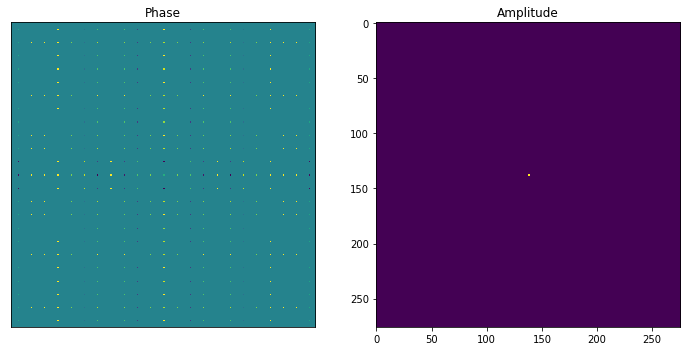

In [9]:
plane = np.ones((x,y))
plane = np.cos(plane) + 1j*np.sin(plane)
fft_plane = np.fft.fftshift(np.fft.fft2(plane))

fig,ax = plt.subplots(1,2)

ax[0].set_title("Phase")
ax[0].imshow(np.angle(fft_plane))
#plt.colorbar()
ax[0].get_xaxis().set_visible(False)
ax[0].get_yaxis().set_visible(False)

ax[1].set_title("Amplitude")
bax = ax[1].imshow(np.abs(fft_plane))

fft_plane

-9.549694368615746e-16
1.0


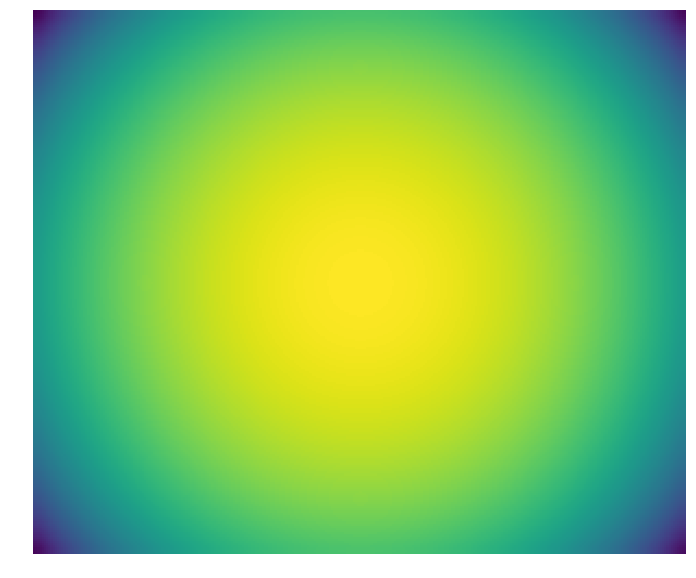

In [10]:
def gen_sphere(x,y,r=50):
    #x *= 2
    #y *= 2
    circ = np.zeros((x,y))

    #r = 80*1 # - Hydrogel
    #r = 50*1 # - Water
    #r = 500*1 # - Water
    #r = 90*1 # - OCT Beads
    r2 = np.power(r,2)
    
    pos_x = x/2
    #pos_x = 136
    pos_y = y/2
    #pos_y = 136
    
    for i in range(x):
        x2 = np.power(i-pos_x,2)
        for j in range(y):
            #print(abs_dist(a,b))
            #circ[i][j] = np.cos(max(abs_dist(i,j)/water_x*pi,0)) # np.cos((np.abs(50-i)+np.abs(50-j))/100)
            #circ[i][j] = max(0.0,np.cos((i)/water_x*np.pi))
            circ[i][j] = np.power(max(0,r2-(x2+np.power(j-pos_y,2))),1/2)
            
    circ = sp.ndimage.filters.gaussian_filter(circ,sigma=3)
    
    mean = np.mean(circ)
    sd = np.std(circ)
    
    circ = (circ-mean)/sd
    
    #circ = circ[:int(x/2),int(y/2):]
    
    return circ

sphere = gen_sphere(250,300,200)
plt.imshow(sphere)
plt.axis('off')

print(np.mean(sphere))
print(np.std(sphere))

In [104]:
def get_gauss_beam(x,y):
    gauss = generate_gaussian_grid(x,y,x*0.05,y*0.05).transpose()
    sphere = gen_sphere(x,y,x*0.05)
    #gauss = generate_gaussian_grid(x,y,x*0.2,y*0.2).transpose()
    #sphere = gen_sphere(x,y,x*0.2)
    gauss = gauss * (np.cos(sphere) + 1j*np.sin(sphere))
    #gauss = gauss * (np.cos(np.ones((x,y))) + 1j*np.sin(np.ones((x,y))))
    return gauss

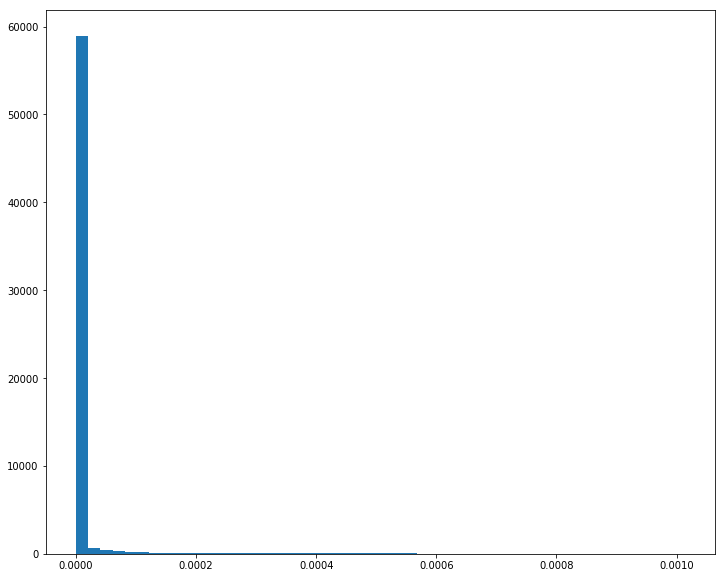

In [116]:
#Test gaussian beam
gauss = get_gauss_beam(250,251)
gauss_abs = np.abs(gauss)
#plt.imshow(gauss_abs)
plt.hist(gauss_abs.flatten(),50)
print()

In [ ]:
gauss = get_gauss_beam(10000,10001)

In [14]:
Image.fromarray(np.abs(gauss)).save('bigger_guass_2.tiff')

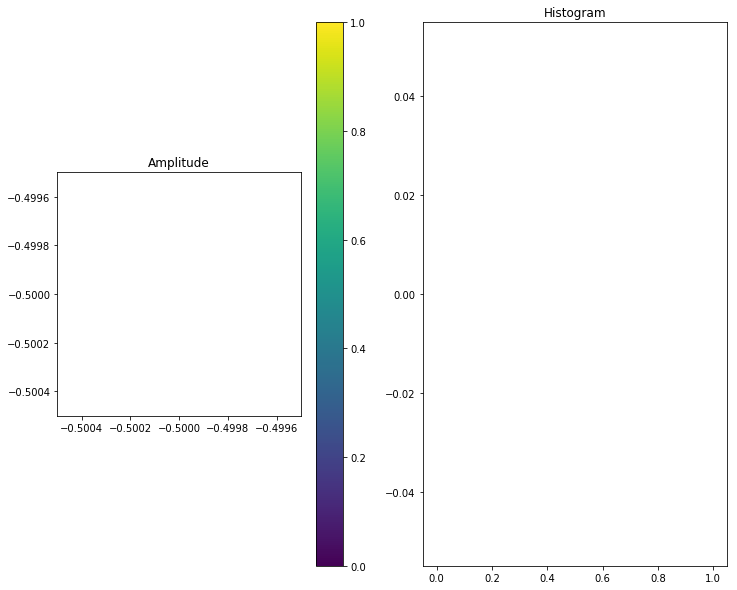

In [117]:
window = gauss[3700:3700+250,5000:5000+250]
window_abs = np.abs(window)

fig,ax = plt.subplots(1,2)

ax[0].set_title("Amplitude")
im0 = ax[0].imshow(window_abs)
fig.colorbar(im0,ax=ax[0])
#ax[0].get_xaxis().set_visible(False)
#ax[0].get_yaxis().set_visible(False)

ax[1].set_title("Histogram")
ax[1].hist(window_abs.flatten(),100)

print()

In [13]:
class WaveAnimation(animation.TimedAnimation):
    def __init__(self,data):
        fig,ax = plt.subplots(1,2)
        self.ax1 = ax[0]
        self.ax2 = ax[1]
        
        ax[0].set_title("Magnitude")
        ax[1].set_title("Phase")
        
        self.data = data
        self.t = len(data)

        animation.TimedAnimation.__init__(self, fig, interval=1000, blit=True)

    def _draw_frame(self, framedata):
        i = framedata-1
        wave_abs = np.abs(self.data[i])
        wave_phase = np.angle(self.data[i])
        
        plt1 = self.ax1.imshow(wave_abs)
        plt2 = self.ax2.imshow(wave_phase)
        self._drawn_artists = [plt1,plt2]

    def new_frame_seq(self):
        return iter(range(self.t))

    def _init_draw(self):
        wave_abs = np.abs(self.data[0])
        wave_phase = np.angle(self.data[0])
        
        plt1 = self.ax1.imshow(wave_abs)
        plt2 = self.ax2.imshow(wave_phase)
        
    def close(self):
        plt.close()

In [14]:
'''
    wavelength - um
    dx - um
    dy - um
    a - degree 
    b - degree
    x - width of output in px
    y - height of output in px
    
    return:
    real - cos(phase)
    imag - phase
'''
def gen_plane_wave(wavelength,dx,dy,a,b,x,y):
    alpha=math.cos(a/180*math.pi)
    beta=math.cos(b/180*math.pi)
    
    if not (1-(alpha**2)-(beta**2) > 0):
        print(alpha**2)
        print(1-(alpha**2)-(beta**2))
        raise ValueError("Insert a valid pair of director angles. Remember that cos^2(a) + cos^2(b) <= 1")
    
    gamma=math.sqrt(1-(alpha**2)-(beta**2))
    
    # wavelength=wavelength*0.001 # Convert wavelength to um
    
    k3 = 3*2*math.pi/wavelength 
    
    if k3 * alpha * dx > (2*math.pi):
        angle = math.degrees(math.acos((2*math.pi) / (k3 * dx)))
        
        raise ValueError("In order to fulfill the sampling theorem, the director angle a >= " + str(angle))
    
    if k3 * beta * dx > (2*math.pi):
        angle = math.degrees(math.acos((2*math.pi) / (k3 * dy)))
        
        raise ValueError("In order to fulfill the sampling theorem, the director angle b >= " + str(angle))
        
    k = 2 * math.pi / wavelength
    
    n = k * gamma
    #p=(np.pi/4) # -RBC
    #p=(np.pi/2)-(np.pi*(17/100)) # - Noisy Beads
    #p = np.pi-(5/9)*np.pi # - Hydrogel
    
    p = -(np.pi*0.75)/4  # - Water Beads
    
    #p = math.cos(10/(180*math.pi))
    
    #p = (np.pi*1.05)/8  # - Water Beads
    
    #p = 2*np.pi - (np.pi/4)
    
    l = np.cos(p)*(np.arange(x) - (x/2) + 1) * dx * alpha * k
    m = np.sin(p)*(np.arange(y) - (y/2) + 1) * dy * beta * k
    
    l = np.broadcast_to(l, (y,x)).transpose()
    m = np.broadcast_to(m, (x,y))
    n = np.broadcast_to(n, (x,y))
    
    phase = l + m + n
    
    phase = np.zeros((x,y))
    
    #pos_x = int(35*np.sin(p) + x/2)# * alpha * dx * k + x/2)
    #pos_y = int(35*np.cos(p) + y/2)# * beta * dy * k + x/2)
    
    pos_x = int(x/2)
    pos_y = int(y/2)
    
    #print(pos_x)
    #print(pos_y)
    
    pos_x = int(x/2 - 50*np.sin(p))# * alpha * dx * k + x/2)
    pos_y = int(y/2 - 50*np.cos(p))# * beta * dy * k + x/2)
    
    phase[pos_x,pos_y] = 1
    
    #phase[pos_x,pos_y] = 10
    
    #plt.imshow(phase)
    
    phase = np.angle(np.fft.ifft2(np.fft.ifftshift(phase)))
    #plt.axis('off')
    
    wavefront_real = np.cos(phase)
    wavefront_imaginary = np.sin(phase)
    
    return wavefront_real, wavefront_imaginary

In [18]:
real, imaginary = gen_plane_wave(0.6328,3.24,3.24,87.05,87.05,x,y)

wave = real+1j*imaginary

f = 10 * 1000
w=500
prop = get_comb(276,276,f)
#prop -= np.min(prop)
#wave *= prop#*np.max(wave)

#wave = (np.abs(prop)-np.min(np.abs(prop))) * np.exp(1j*(np.angle(prop) + np.angle(wave)))
#wave = prop
fig,ax = plt.subplots(1,2)

ax[0].set_title("Phase")
aax = ax[0].imshow(np.angle(wave))
ax[0].get_xaxis().set_visible(False)
ax[0].get_yaxis().set_visible(False)

ax[1].set_title("Amplitude")
bax = ax[1].imshow(np.abs(wave))

fig.colorbar(aax,ax=ax[0])
bbar = fig.colorbar(bax,ax=ax)

NameError: name 'get_comb' is not defined

In [91]:
# Propagate only
x = 255
y = 255
#f = 40 * 1000
wavelength = 0.638

def get_comb(x,y,f,gauss=None,n = None):
    if gauss is None:
        gauss = get_gauss_beam(x,y)
    if(n is None):
        noise = gen_noise_random_size(x,y)
    else:
        noise = n
    
    noise = sp.ndimage.filters.gaussian_filter(noise,sigma=3)
    #print(np.mean(np.abs(noise)))
    noise_abs = np.abs(noise/np.max(np.abs(noise))*0.05)
    
    noise = (np.cos(noise) + 1j*np.sin(noise)) * (1 - noise_abs)
    
    #plt.hist(np.angle(noise).flatten())
    
    #print(noise)

    #mat = np.broadcast_to(range(-int(x/2),x-int(x/2)),(y,x))
    #mat_2 = np.broadcast_to(range(-int(y/2),y-int(y/2)),(x,y)).transpose()

    #lens = np.exp(-1j*(2*np.pi/wavelength)*((mat**2+mat_2**2)/2/f)).transpose()

    #gauss = gauss*lens
    
    #print(noise.shape)
    #print(gauss.shape)
    
    fft_gauss = np.fft.fftshift(np.fft.fft2(gauss))
    fft_noise = np.fft.fftshift(np.fft.fft2(noise))

    comb = np.fft.ifft2(np.fft.ifftshift(fft_noise*fft_gauss))
    #comb = noise*gauss
    #comb = np.fft.fftshift(np.fft.fft2(comb))
    fig,ax = plt.subplots(2,2)
    ax[0][0].set_title("Amplitude: Noise")
    im0 = ax[0][0].imshow(np.log(np.abs(fft_noise)))
    #fig.colorbar(im0,ax=ax[0])
    #ax[0].get_xaxis().set_visible(False)
    #ax[0].get_yaxis().set_visible(False)

    ax[0][1].set_title("Phase: Noise")
    im1 = ax[0][1].imshow(np.angle(fft_noise))
    #fig.colorbar(im1,ax=ax[1])
    
    ax[1][0].set_title("Amplitude: Gauss")
    im0 = ax[1][0].imshow(np.log(np.abs(fft_gauss)))
    #fig.colorbar(im0,ax=ax[0])
    #ax[0].get_xaxis().set_visible(False)
    #ax[0].get_yaxis().set_visible(False)

    ax[1][1].set_title("Phase: Gauss")
    im1 = ax[1][1].imshow(np.angle(fft_gauss))

    
    #plt.imshow(np.angle(noise))
    #plt.imshow(np.angle(lens))
    #plt.colorbar()
    
    comb_phase = np.angle(comb)
    comb_abs = np.abs(comb)
    comb /=(comb.shape[0]*comb.shape[1])
    
    return comb

In [16]:
def get_noisy_hologram(x,y,f,plane_wave = None):
    if plane_wave is None:
        plane_wave = gen_plane_wave(0.6328,3.24,3.24,87.05,87.05,x,y)

    prop = get_comb(x,y,f)
    #print("Min: " + str(np.min(np.angle(prop))))
    #print("Max: " + str(np.max(np.angle(prop))))
    
    #angle = np.angle(prop) - np.min(np.angle(prop))
    #angle /= np.max(angle)
    #angle *= np.pi * 2
    #angle -= np.pi
    
    #mag = np.abs(prop) - np.min(np.abs(prop))
    #mag *= 10
    
    #plt.hist(np.abs(prop).flatten())
    #mag /= np.abs(prop)
    #mag *= 10
    
    #print("Min: " + str(np.min(mag)))
    #print("Max: " + str(np.max(mag)))
    
    #wave = mag * np.exp(1j*(angle+np.angle(plane_wave)))
    
    #print(np.abs(wave)-np.abs(prop))
    
    #wave = plane_wave + prop*10
    wave += np.ones((x,y)) + 1j*np.zeros((x,y))
    return wave

In [111]:
#Test gauss beam + noise
x = 525
y = 524
f = 5000

num_imgs = 10

gauss = get_gauss_beam(x,y)
noise = gen_noise_random_size(x,y)

noises = []
for i in range(num_imgs):
    noises.append(gen_noise_random_size(x,y))

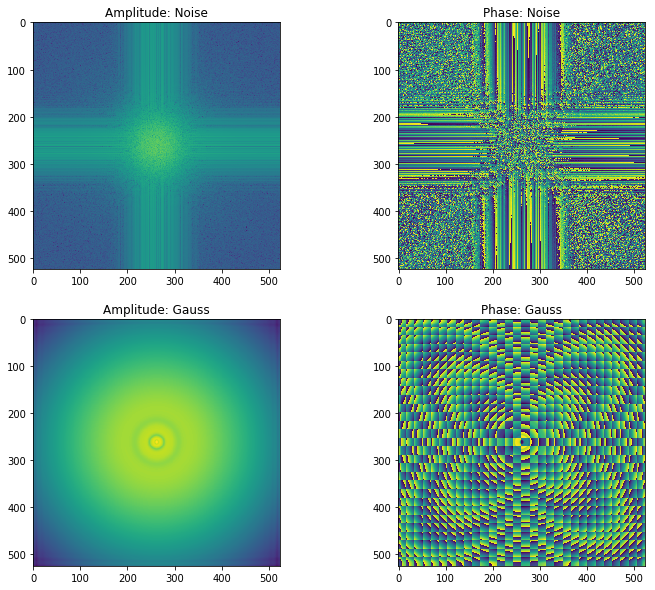

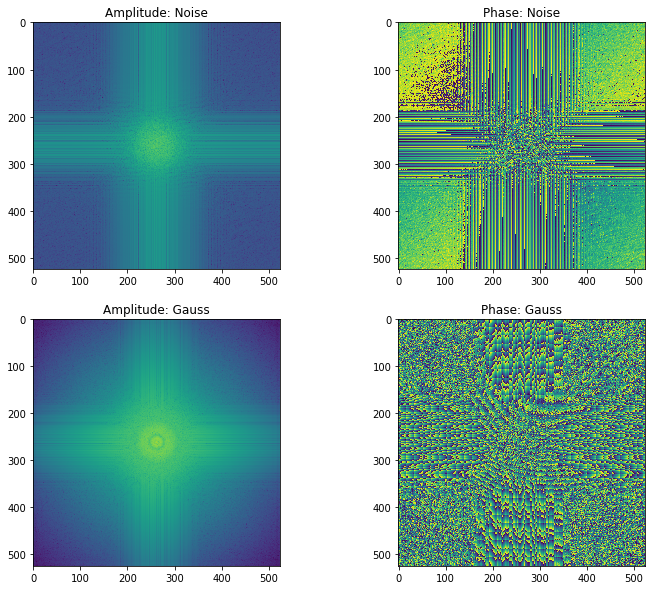

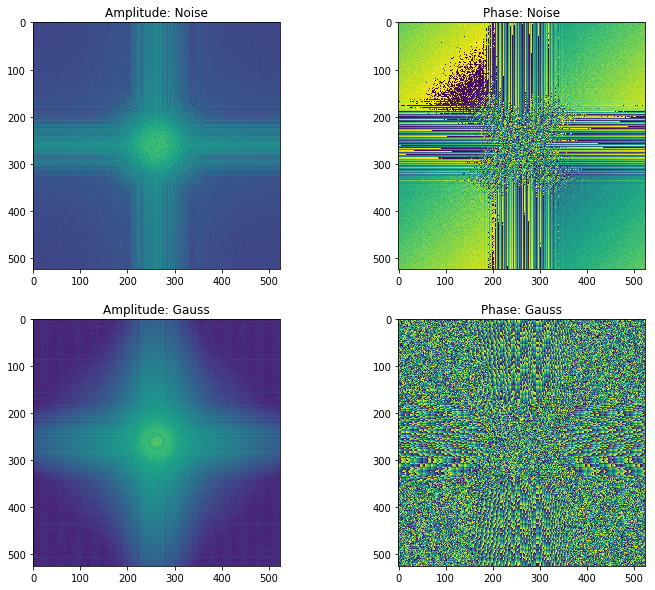

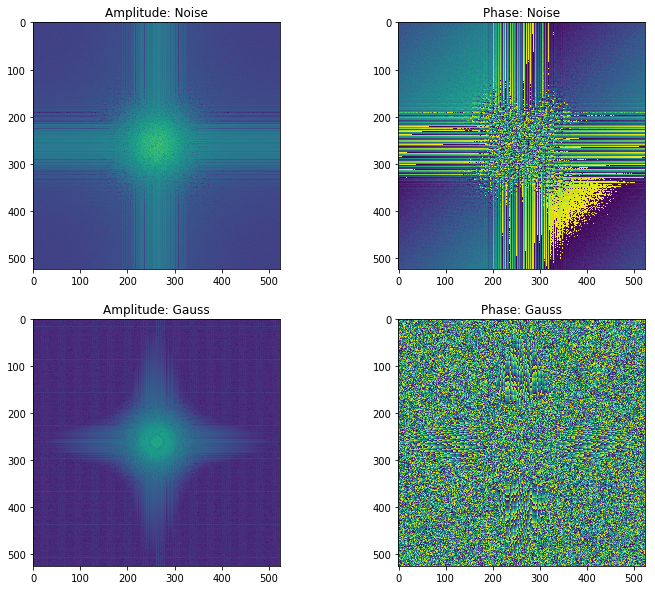

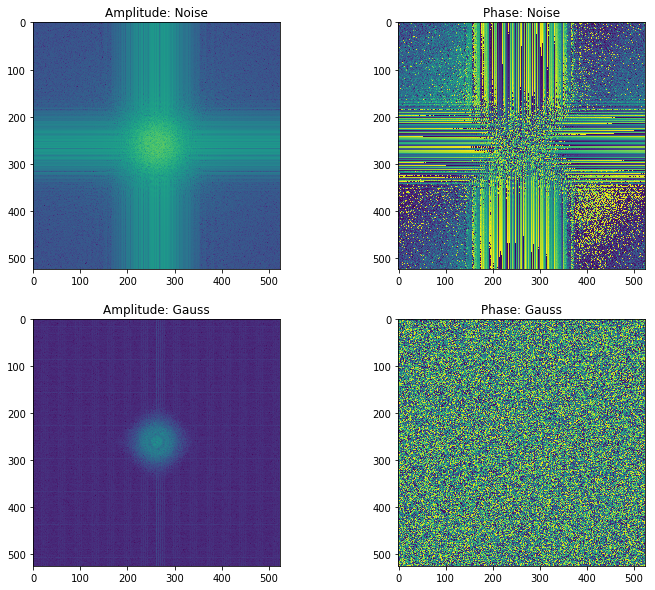

...

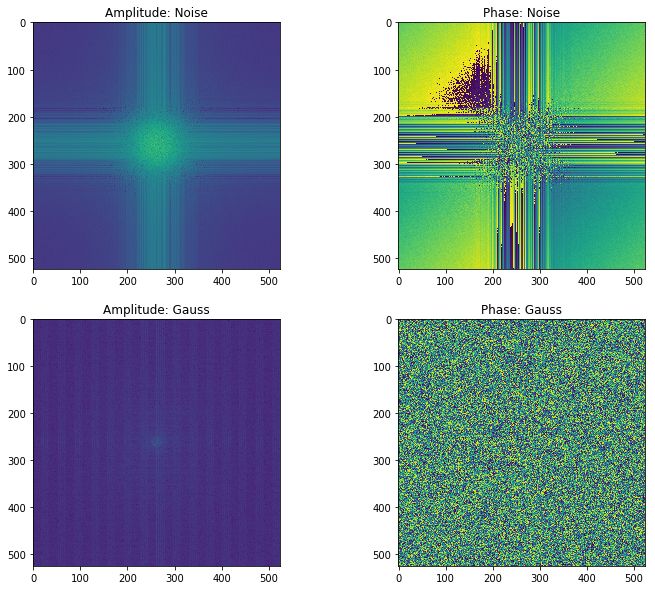

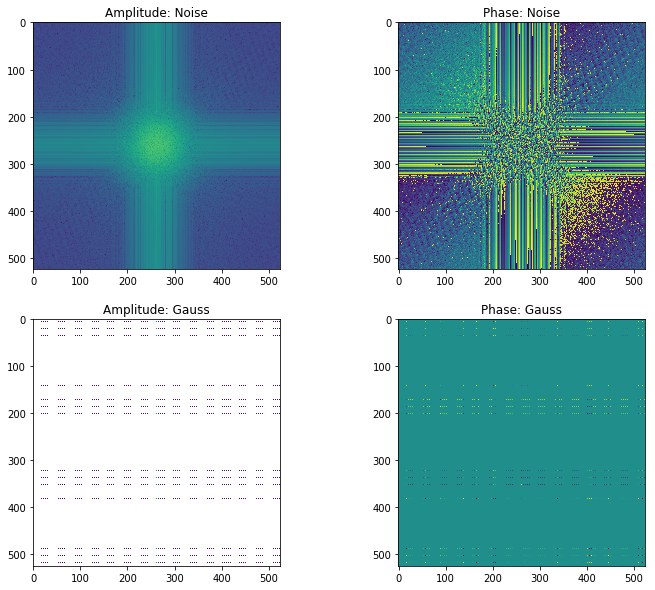

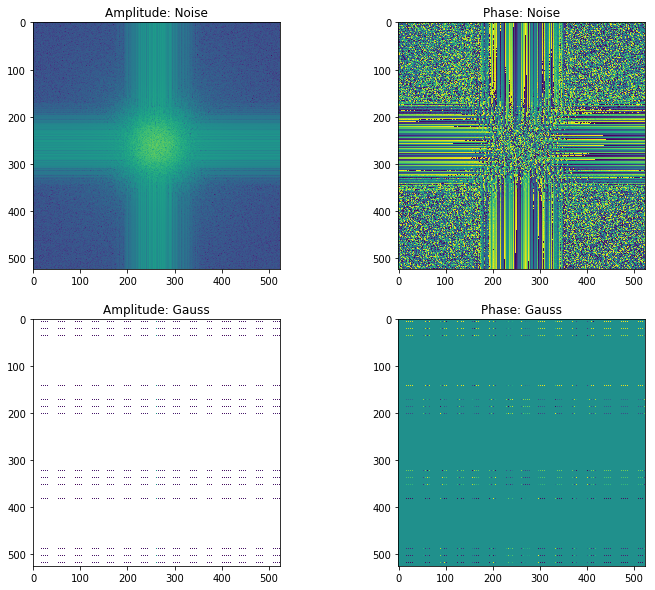

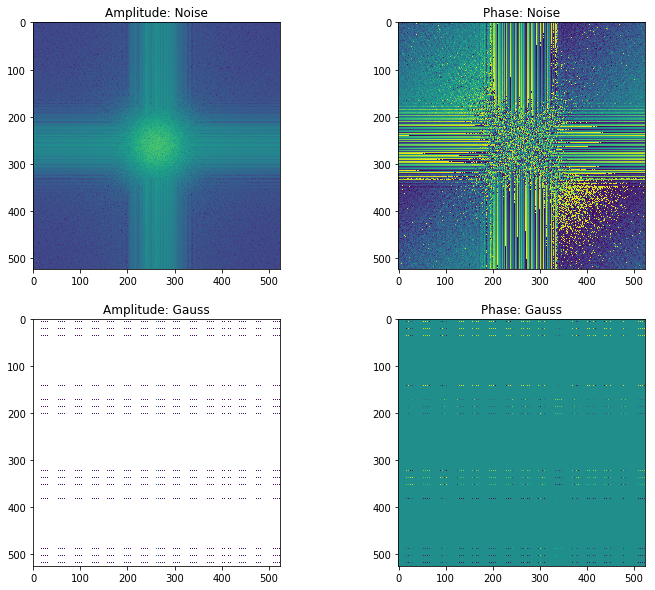

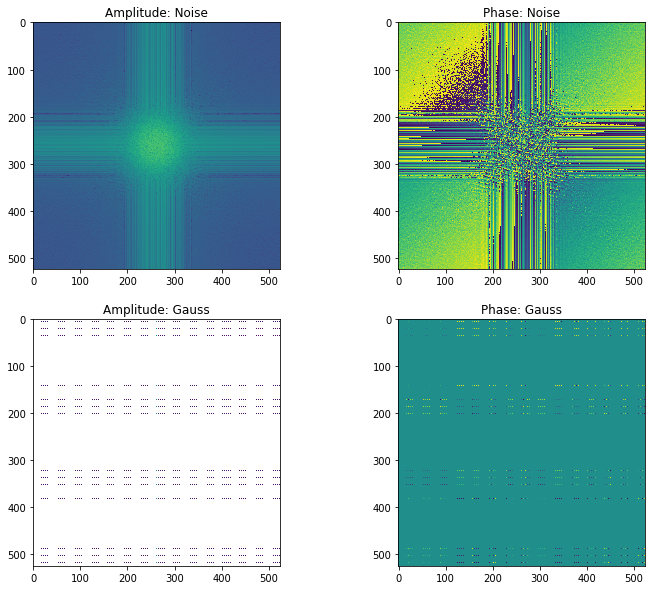

In [112]:
#noise = np.zeros((x,y))
comb = get_comb(x,y,f,gauss,noise)

combs = [comb]

for i in range(num_imgs):
    combs.append(get_comb(x,y,f,combs[i],noises[i]))

print()
#wave = gen_noise_random_size(x,y)

In [113]:
ani = WaveAnimation(combs)
ani.close()
HTML(ani.to_html5_video())

0.47266938899217714
0.4570519475498356
0.44101421223801857
0.4268554288136378
0.4123212381365757
0.3983192420600502
0.3845061373099696


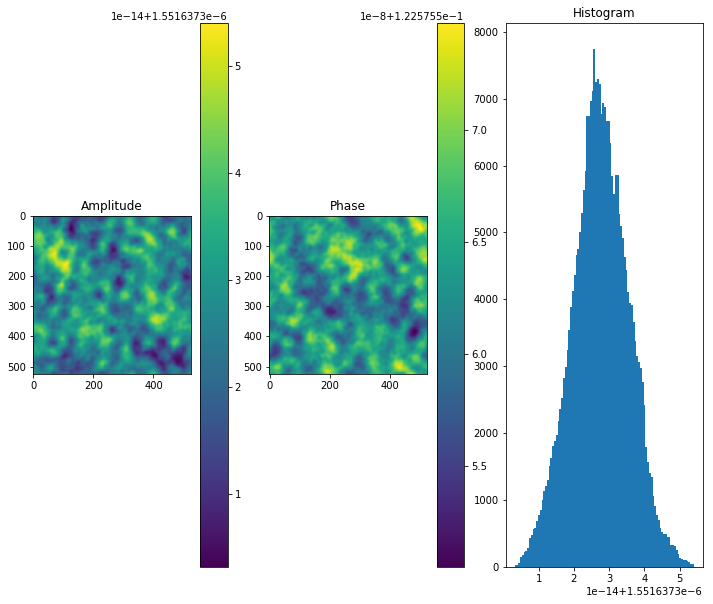

In [108]:
window = combs[3]#[3700:3700+250,5000:5000+250]
abs_comb = np.abs(window)

fig,ax = plt.subplots(1,3)

ax[0].set_title("Amplitude")
im0 = ax[0].imshow(abs_comb)
fig.colorbar(im0,ax=ax[0])
#ax[0].get_xaxis().set_visible(False)
#ax[0].get_yaxis().set_visible(False)

ax[1].set_title("Phase")
im1 = ax[1].imshow(np.angle(window))
fig.colorbar(im1,ax=ax[1])

ax[2].set_title("Histogram")
ax[2].hist(abs_comb.flatten(),100)

print(np.sum(np.abs(combs[0])))
print(np.sum(np.abs(combs[1])))
print(np.sum(np.abs(combs[2])))
print(np.sum(np.abs(combs[3])))
print(np.sum(np.abs(combs[4])))
print(np.sum(np.abs(combs[5])))
print(np.sum(np.abs(combs[6])))

In [44]:
ani = WaveAnimation(combs)
ani.close()
HTML(ani.to_html5_video())

In [99]:
windows = []
for frame in combs_flat:
    windows.append(frame[3700:3700+1000,5000:5000+1000])
    
ani = WaveAnimation(windows)
ani.close()
HTML(ani.to_html5_video())

NameError: name 'combs_flat' is not defined

In [98]:
#Test propogation
f = 5000

mat = np.broadcast_to(range(-int(x/2),x-int(x/2)),(y,x))
mat_2 = np.broadcast_to(range(-int(y/2),y-int(y/2)),(x,y)).transpose()

lens = np.exp(-1j*(2*np.pi/wavelength)*((mat**2+mat_2**2)/2/f)).transpose()

lensed_comb = lens*comb

ValueError: operands could not be broadcast together with shapes (255,255) (525,524) 

In [97]:
window = lensed_comb#[3700:3700+250,5000:5000+250]
abs_window = np.abs(window)

fig,ax = plt.subplots(1,2)

ax[0].set_title("Amplitude")
im0 = ax[0].imshow(abs_window)
fig.colorbar(im0,ax=ax[0])

ax[1].set_title("Histogram")
ax[1].hist(abs_window.flatten(),100)

print()

NameError: name 'lensed_comb' is not defined

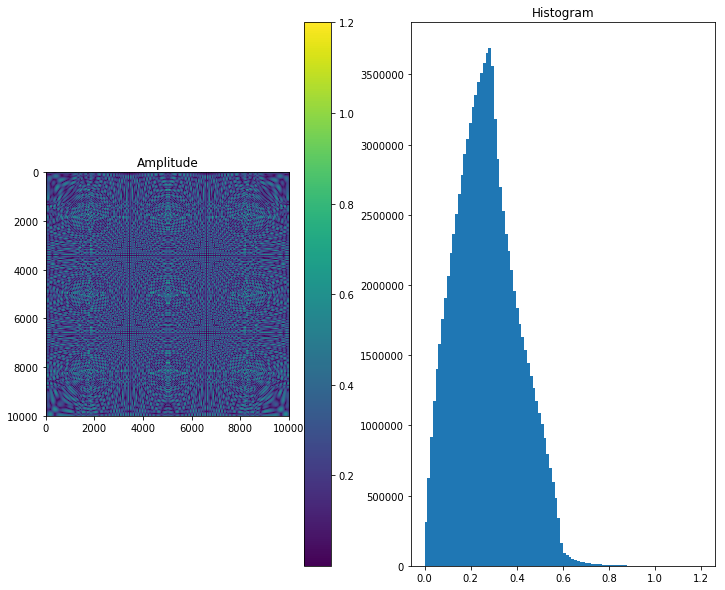

In [80]:
propogator = get_kernel(wavelength, -5000, x*1.01, y*1.01, x,y)
prop_fft = np.fft.fftshift(np.fft.fft2(lensed_comb))*propogator
prop = np.fft.ifft2(np.fft.ifftshift(prop_fft))

window = prop#[3700:3700+250,5000:5000+250]
abs_window = np.abs(window)

fig,ax = plt.subplots(1,2)

ax[0].set_title("Amplitude")
im0 = ax[0].imshow(abs_window)
fig.colorbar(im0,ax=ax[0])

ax[1].set_title("Histogram")
ax[1].hist(abs_window.flatten(),100)

print()

In [26]:
#Test gauss beam propogation
x = 250
y = 300
f = 5000

#gauss = get_gauss_beam(x,y)

#mat = np.broadcast_to(range(-int(x/2),int(x/2)+1),(x,y))
#mat_2 = np.broadcast_to(range(-int(y/2),int(y/2)+1),(y,x)).transpose()

#lens = np.exp(-1j*(2*np.pi/wavelength)*((mat**2+mat_2**2)/2/f))

#gauss = gauss*lens

#fft_gauss = np.fft.fftshift(np.fft.fft2(gauss))

real, imaginary = gen_plane_wave(0.6328,3.24,3.24,87.05,87.05,x,y)

wave = real+1j*imaginary

#fig,ax = plt.subplots(1,2)
    
hologram = get_noisy_hologram(x,y,f,wave)
plt.hist(hologram.flatten(),100)
print()
#wave = gen_noise_random_size(x,y)

ValueError: low >= high

In [49]:
#Test gauss beam propogation with lens
x = 250
y = 300
f = 5000

gauss = get_gauss_beam(x,y)

#mat = np.broadcast_to(range(-int(x/2),int(x/2)+1),(x,y))
#mat_2 = np.broadcast_to(range(-int(y/2),int(y/2)+1),(y,x)).transpose()

#lens = np.exp(-1j*(2*np.pi/wavelength)*((mat**2+mat_2**2)/2/f))

#gauss = gauss*lens

#fft_gauss = np.fft.fftshift(np.fft.fft2(gauss))

real, imaginary = gen_plane_wave(0.6328,3.24,3.24,87.05,87.05,x,y)

wave = real+1j*imaginary

#fig,ax = plt.subplots(1,2)

imgs = []

for i in range(40):
    #mat_x = np.broadcast_to(range(-int(x/2),int(x/2)+1),(x,y))
    #mat_y = np.broadcast_to(range(-int(y/2),int(y/2)+1),(y,x)).transpose()
    #G1 = np.exp(-(mat_x**2+mat_y**2)/((w/2)**2))*np.exp(-1j*2*mat_x)
    
    #G1_mean = np.mean(G1)
    #G1_std = np.std(G1)
    
    #G1 = (G1-G1_mean)/G1_std
    
    hologram = get_noisy_hologram(x,y,f,wave)
    #wave = gen_noise_random_size(x,y)
    imgs.append(hologram)
    
ani = WaveAnimation(imgs)
ani.close()
HTML(ani.to_html5_video())

0.06757814666735674


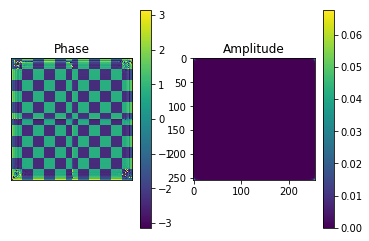

In [19]:
z = 0

comb = get_comb(5000,noise)
propogator = get_kernel(wavelength, 10, 260, 260, x,y)
#propogator = get_kernel(wavelength, 10, 255, 255, x,y)

prop = comb*propogator

wave = np.fft.ifft2(np.fft.ifftshift(prop))

fig,ax = plt.subplots(1,2)

ax[0].set_title("Phase")
im0 = ax[0].imshow((np.angle(wave)))
fig.colorbar(im0,ax=ax[0])
ax[0].get_xaxis().set_visible(False)
ax[0].get_yaxis().set_visible(False)

ax[1].set_title("Amplitude")
im1 = ax[1].imshow(np.abs(wave))
fig.colorbar(im1,ax=ax[1])
#fft_noise

print(np.max(np.abs(wave)))

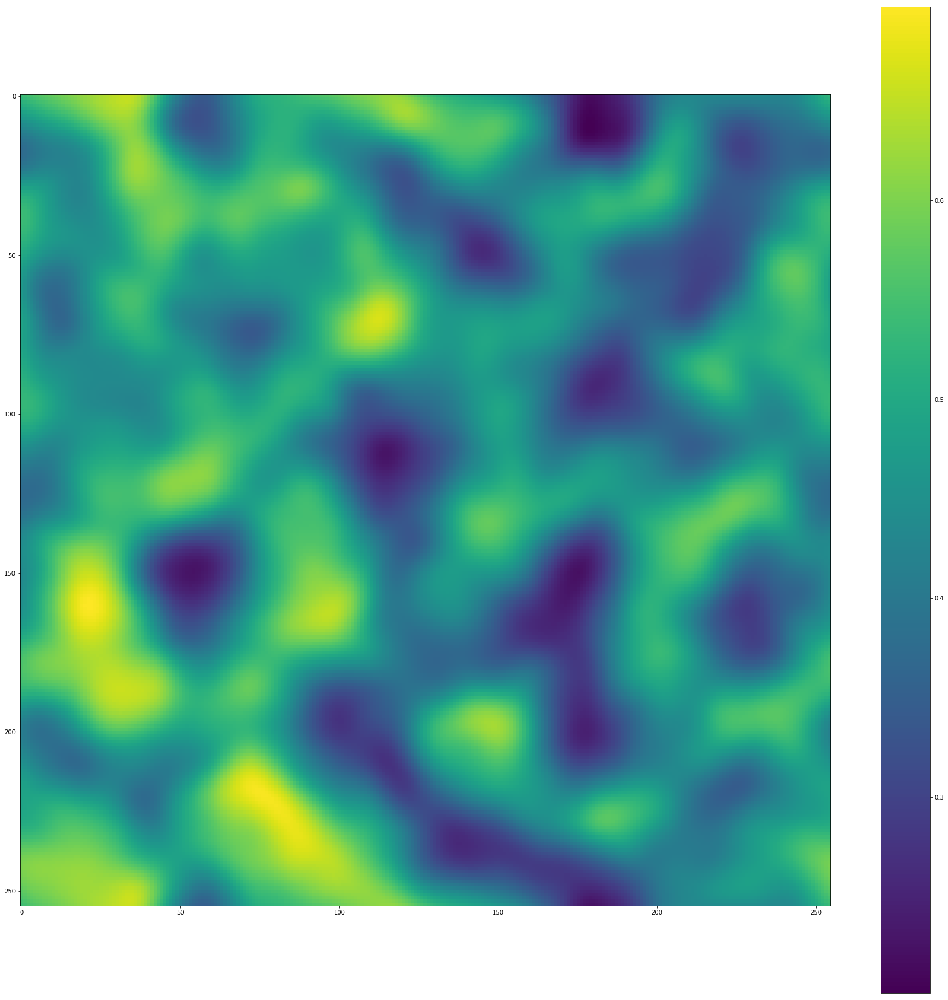

In [18]:
f = 10 * 1000
w=500
prop = get_comb(f,noise)

gauss = generate_gaussian_grid(x,y,50,50)
sphere = gen_sphere(x,y,50)
gauss = gauss * (np.cos(sphere) + 1j*np.sin(sphere))

mat_x = np.broadcast_to(range(-int(x/2),int(x/2)+1),(x,y))
mat_y = np.broadcast_to(range(-int(y/2),int(y/2)+1),(y,x)).transpose()
G1 = np.exp(-(mat_x**2+mat_y**2)/((w/2)**2))*np.exp(-1j*2*mat_x)

G1_mean = np.mean(G1)
G1_std = np.std(G1)

G1 = (G1-G1_mean)/G1_std/100

interf = np.angle(prop)

fig = plt.figure(figsize=(30, 30))
plt.imshow(interf)
plt.colorbar()

In [26]:
#comb = get_comb()
 
fig = plt.figure(figsize=(10, 10))

imgs = []

noise = gen_noise_random_size(x,y)

for i in range(-40,40,5):
    prop_dist = (i+1) * 200
    prop = get_comb(5000,noise)
    
    gauss = generate_gaussian_grid(x,y,50,50)
    sphere = gen_sphere(x,y,50)
    gauss = gauss * (np.cos(sphere) + 1j*np.sin(sphere))
    
    mat_x = np.broadcast_to(range(-int(x/2),int(x/2)+1),(x,y))
    mat_y = np.broadcast_to(range(-int(y/2),int(y/2)+1),(y,x)).transpose()
    G1 = np.exp(-(mat_x**2+mat_y**2)/((w/2)**2))*np.exp(-1j*2*mat_x)
    
    G1_mean = np.mean(G1)
    G1_std = np.std(G1)
    
    G1 = (G1-G1_mean)/G1_std/100
    
    interf = np.abs(prop+G1)
    
    #wave = np.fft.ifft2(np.fft.ifftshift(prop))
    #im = plt.imshow(np.abs(wave), animated=True)
    im = plt.imshow(interf,animated=True)
    
    imgs.append([im])
plt.colorbar()
ani = animation.ArtistAnimation(fig, imgs, interval=1000, blit=True, repeat_delay=1000)
plt.close()

HTML(ani.to_html5_video())

In [48]:
comb = get_comb()
 
fig = plt.figure(figsize=(10, 10))

imgs = []

for i in range(-80,80,5):
    propogator = get_kernel(wavelength, i*1, 260, 260, x,y)
    prop = comb*propogator

    wave = np.fft.ifft2(np.fft.ifftshift(prop))
    im = plt.imshow(np.abs(wave), animated=True)
    
    imgs.append([im])
    
ani = animation.ArtistAnimation(fig, imgs, interval=1000, blit=True, repeat_delay=1000)
plt.close()

HTML(ani.to_html5_video())

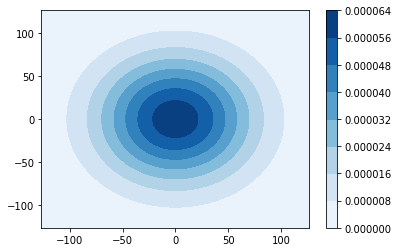

Animation movie is 40712543 bytes, exceeding the limit of 20971520.0. If you're sure you want a large animation embedded, set the animation.embed_limit rc parameter to a larger value (in MB).


In [32]:
# Propagate only
x = 255
y = 255
z = 0

gauss = generate_gaussian_grid(x,y,x/5,y/5)
gauss = np.cos(gauss) + 1j*np.sin(gauss)
noise = gen_noise_random_size(x,y)
noise = sp.ndimage.filters.gaussian_filter(noise,sigma=3)
noise = np.cos(noise) + 1j*np.sin(noise)

fft_gauss = np.fft.fftshift(np.fft.fft2(gauss))
fft_noise = np.fft.fftshift(np.fft.fft2(noise))

comb = fft_noise*fft_gauss

fig = plt.figure(figsize=(10, 10))

imgs = []

for i in range(-200,200,1):
    propogator = get_kernel(wavelength, i, 260, 260, x,y)
    prop = noise*propogator

    wave = np.fft.ifft2(np.fft.ifftshift(prop))
    im = plt.imshow(np.angle(wave), animated=True)
    imgs.append([im])
    
ani = animation.ArtistAnimation(fig, imgs, interval=1000, blit=True, repeat_delay=1000)
plt.close()

HTML(ani.to_html5_video())

In [52]:
def fit_func(data,a,b,c,d,e,f):
    l_x = len(data[:,0])
    l_y = len(data[0])

    y = data[0]
    x = np.repeat(range(1,l_x+1), l_y)
    y = np.tile(range(1,len(data[0])+1), ((l_x,1))).flatten()

    '''print("X: ")
    print(x)
    print(x.shape)
    print("Y: ")
    print(y)
    print(y.shape)'''

    f = a+b*x+c*y+d*x*y+e*np.power(x,2)+f*np.power(y,2)
    return f

def curve_params(pp):
    x,y = pp.shape
    lin_x = np.linspace(1,x,x)
    lin_y = np.linspace(1,y,y)
    tile_x = np.tile(lin_y,(x,1))
    tile_y = np.tile(lin_x.transpose(),(y,1)).transpose()

    xy = np.tile(lin_x.flatten(),(y,1))
    z = pp.transpose().flatten()

    popt, pcov = curve_fit(fit_func,xy,z) # , bounds=([0,0,0,0,0,0],[np.inf,np.inf,np.inf,np.inf,np.inf,np.inf])

    '''print(tile_x)
    print(tile_y)

    print(tile_x.shape)
    print(tile_y.shape)
    print((tile_x*tile_y).shape)
    print(np.power(tile_y,2).shape)

    print("Popt")
    print(popt)
    print(pcov)

    print("PP shape")
    print(pp.shape)

    print("Z: ")
    print(z)'''

    return popt

def curve_removal(pp, params=None):
    x,y = pp.shape
    lin_x = np.linspace(1,x,x)
    lin_y = np.linspace(1,y,y)
    tile_x = np.tile(lin_y,(x,1))
    tile_y = np.tile(lin_x.transpose(),(y,1)).transpose()

    if params is not None:
        popt = params
    else:
        popt = curve_params(pp)

    return popt[0]+ popt[1]*tile_x+popt[2]*tile_y+popt[3]*tile_x*tile_y+popt[4]*np.power(tile_x,2)+popt[5]*np.power(tile_y,2)

In [53]:
pp = np.asarray(Image.open('I://Honours-Project//data//Diffuser no fringe test//no_diffuser.TIF'))
c_params = curve_params(pp)
#curve=self.curve_removal(pp, self.c_params)
curve = curve_removal(pp,None)

In [55]:
print(c_params)

[ 1.82404499e+02  7.80452389e-02  2.31463167e-01 -6.94384996e-05
 -3.04449723e-05  4.17985583e-05]


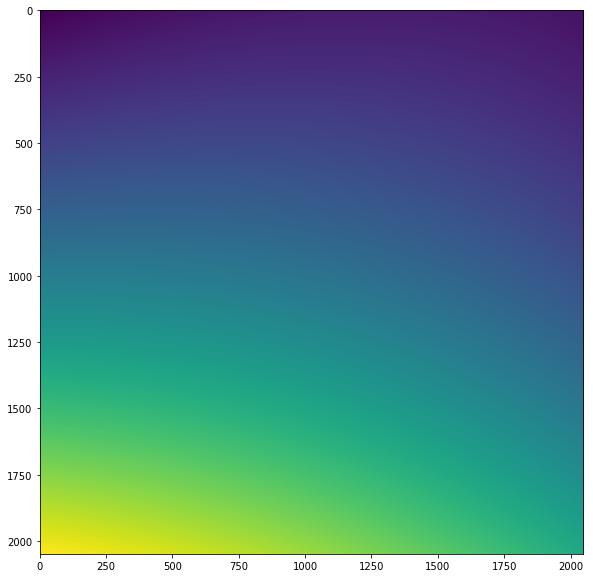

In [57]:
plt.imshow(curve)
Image.fromarray(curve).save('quadratic_curve.tiff')

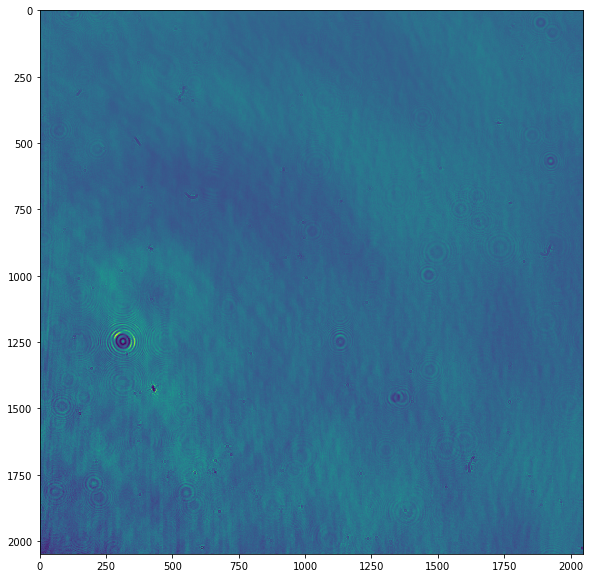

In [56]:
plt.imshow(pp-curve)